In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.utils import to_categorical
import numpy as np
import seaborn as sns
from sklearn.metrics import accuracy_score, confusion_matrix
from tensorflow.keras.utils import to_categorical
import seaborn as sns
import pandas as pd
import plotly.graph_objects as go
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import time
import pickle

In [11]:
df = pd.read_csv('Dataset/Dataset.csv')
df

,RMS,MAV,WL,ZC,MDF,MNF,MNP,SSC,IMDF,IMPF,PSD,stft_feature_1,stft_feature_2,stft_feature_3,stft_feature_4,stft_feature_5,stft_feature_6,Label
0,0.022841,0.022706,0.483595,0,0.000000,2.489175,0.000003,158,16.518352,17.618662,1.130000e-08,6.774418,1.377672,5.754366,30.175375,12.927660,25.273105,0
1,0.022794,0.022662,0.485715,0,0.000000,2.506647,0.000003,164,16.782191,17.931836,1.070000e-08,5.662441,1.393016,6.846858,24.437476,13.112665,29.475967,0
2,0.022645,0.022528,0.477993,0,0.000000,2.237612,0.000003,168,16.637085,17.573391,1.080000e-08,5.584053,1.358473,5.443189,24.489376,12.605244,25.167456,0
3,0.022693,0.022562,0.500790,0,0.000000,2.524220,0.000003,161,16.585261,17.337538,1.270000e-08,6.091725,1.397829,6.639651,28.104471,12.749093,28.418401,0
4,0.022700,0.022582,0.488504,0,0.000000,2.285447,0.000003,165,16.575535,19.306378,1.040000e-08,5.348125,1.387617,6.076112,24.105152,12.775142,26.901100,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31847,0.053433,0.039858,7.085237,56,85.937500,84.249364,0.000010,88,41.857455,44.759016,4.780000e-06,82.926112,84.139275,93.709869,55.754412,59.775668,86.626090,3
31848,0.053844,0.041779,7.588742,54,89.843750,88.885302,0.000010,93,47.455067,47.969045,6.540000e-06,92.118496,88.345092,89.257183,58.734349,56.700056,64.391981,3
31849,0.051590,0.040779,7.423677,54,82.031250,86.417881,0.000009,108,45.379991,46.693901,4.060000e-06,89.015354,78.412589,101.431714,69.812202,64.865193,67.262077,3
31850,0.045657,0.036596,6.185673,49,56.640625,78.036992,0.000007,116,42.441254,44.566119,3.360000e-06,77.561491,86.177547,68.945323,70.359082,69.339442,64.834670,3


In [60]:
feature_columns = ['MDF','SSC','IMDF','IMPF','stft_feature_5','stft_feature_6','stft_feature_3', 'RMS','MAV', 'WL','MNF']

In [12]:
# Analyze label distribution
label_counts = df['Label'].value_counts()
print("Label Distribution:\n", label_counts)

Label Distribution:
 Label
1    9644
2    8249
3    7793
0    6166
Name: count, dtype: int64


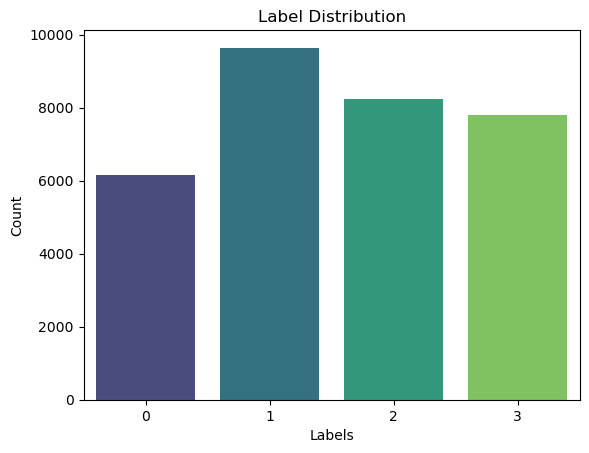

In [13]:
# Plot label distribution with seaborn
sns.countplot(x='Label', data=df, palette='viridis')
plt.title('Label Distribution')
plt.xlabel('Labels')
plt.ylabel('Count')
plt.show()


In [5]:
df1 = df.drop(columns=['Label'])
df1

,RMS,MAV,WL,ZC,MDF,MNF,MNP,SSC,IMDF,IMPF,PSD,stft_feature_1,stft_feature_2,stft_feature_3,stft_feature_4,stft_feature_5,stft_feature_6
0,0.022841,0.022706,0.483595,0,0.000000,2.489175,0.000003,158,16.518352,17.618662,1.130000e-08,6.774418,1.377672,5.754366,30.175375,12.927660,25.273105
1,0.022794,0.022662,0.485715,0,0.000000,2.506647,0.000003,164,16.782191,17.931836,1.070000e-08,5.662441,1.393016,6.846858,24.437476,13.112665,29.475967
2,0.022645,0.022528,0.477993,0,0.000000,2.237612,0.000003,168,16.637085,17.573391,1.080000e-08,5.584053,1.358473,5.443189,24.489376,12.605244,25.167456
3,0.022693,0.022562,0.500790,0,0.000000,2.524220,0.000003,161,16.585261,17.337538,1.270000e-08,6.091725,1.397829,6.639651,28.104471,12.749093,28.418401
4,0.022700,0.022582,0.488504,0,0.000000,2.285447,0.000003,165,16.575535,19.306378,1.040000e-08,5.348125,1.387617,6.076112,24.105152,12.775142,26.901100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31847,0.053433,0.039858,7.085237,56,85.937500,84.249364,0.000010,88,41.857455,44.759016,4.780000e-06,82.926112,84.139275,93.709869,55.754412,59.775668,86.626090
31848,0.053844,0.041779,7.588742,54,89.843750,88.885302,0.000010,93,47.455067,47.969045,6.540000e-06,92.118496,88.345092,89.257183,58.734349,56.700056,64.391981
31849,0.051590,0.040779,7.423677,54,82.031250,86.417881,0.000009,108,45.379991,46.693901,4.060000e-06,89.015354,78.412589,101.431714,69.812202,64.865193,67.262077
31850,0.045657,0.036596,6.185673,49,56.640625,78.036992,0.000007,116,42.441254,44.566119,3.360000e-06,77.561491,86.177547,68.945323,70.359082,69.339442,64.834670


In [59]:
# Function to plot the distribution of each feature based on the label in a grid
def plot_feature_distributions_grid(df, feature_columns, label_col='Label'):
    num_features = len(feature_columns)
    num_cols = 3  # Number of columns in the grid
    num_rows = (num_features + num_cols - 1) // num_cols  # Calculate number of rows needed
    
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(50, num_rows * 5))
    axes = axes.flatten()
    
    for i, feature in enumerate(feature_columns):
        sns.kdeplot(data=df, x=feature, hue=label_col, fill=True, common_norm=False, alpha=0.5, ax=axes[i])
        axes[i].set_title(f'Distribution of {feature} by {label_col}')
        axes[i].set_xlabel(feature)
        axes[i].set_ylabel('Density')
        
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])
        
    plt.tight_layout()
    plt.show()


In [6]:
# Create a subplot for each column in the DataFrame
fig = go.Figure()
for column in df1.columns:
    fig.add_trace(go.Histogram(x=df1[column], name=column))

# Update layout
fig.update_layout(
    title='Distribution of X_train before scaling',
    xaxis_title='Value',
    yaxis_title='Frequency',
    barmode='overlay'  # Overlay histograms for better visualization
)

# Show the plot
fig.show()


In [8]:
# Create figure
fig = go.Figure()

# Plot non Fatigue data
fig.add_trace(go.Scatter(x=df[df['Label'] == 0].index, y=df[df['Label'] == 0]['MNF'], mode='lines', name="Resting"))

# Plot Transition to Fatigue data
fig.add_trace(go.Scatter(x=df[df['Label'] == 1].index, y=df[df['Label'] == 1]['MNF'], mode='lines', name="No strain"))

# Plot Transition to Fatigue data
fig.add_trace(go.Scatter(x=df[df['Label'] == 2].index, y=df[df['Label'] == 2]['MNF'], mode='lines', name="medium strain"))

# Plot Fatigue data
fig.add_trace(go.Scatter(x=df[df['Label'] == 3].index, y=df[df['Label'] == 3]['MNF'], mode='lines', name="max strain"))



# Update layout
fig.update_layout(
    title="ARV Raw Signal",
    xaxis_title="Time",
    yaxis_title="Amplitude"
)

# Show plot
fig.show()


In [10]:
feature_columns = ['RMS', 'MAV', 'WL', 'SSC', 'MDF', 'MNF', 'MNP', 'PSD', 'stft_feature_1', 'stft_feature_2', 'stft_feature_3']
Label_column = ['Label']

In [11]:
# Split the DataFrame into features (X) and target (y)
X = df[feature_columns]
Y = df[Label_column]  # Replace 'target_column' with the name of your target column


In [12]:
X.shape

(33014, 11)

In [13]:
# Scale the features using StandardScaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [14]:
timesteps = 30
num_features = X_scaled.shape[1]

data_segments = {f'X{j}': [] for j in range(num_features)}  # Dictionary to store segments for each feature
y = []  # List to store labels

# Segment the data from df
for i in range(0, X.shape[0] - timesteps):
    for j in range(num_features):  # Loop for column indexing
        data_segments[f'X{j}'].append(X.iloc[i:i + timesteps, j].values)

# Segment the labels from labels_df
for i in range(0, Y.shape[0] - timesteps):
    y.append(Y.iloc[i + timesteps, 0])  # Assuming the label to predict is the last one in the window


In [15]:
y_encoded= to_categorical(y, num_classes=4)

In [16]:
# Convert lists in data_segments to NumPy arrays for easier manipulation
X_segments = np.array([np.array(data_segments[f'X{j}']) for j in range(num_features)])
X_segments = np.swapaxes(X_segments, 0, 1)  # Swap axes to get the shape (samples, timesteps, features)
X_segments = np.swapaxes(X_segments, 1, 2)  # Final shape: (samples, timesteps, features)

# Convert labels list to a NumPy array
Y = np.array(y_encoded)

# Splitting the data into training and test sets
X_train, X_test, Y_train, Y_test = train_test_split(X_segments, Y, test_size=0.2, random_state=4)


In [17]:
X_train.shape

(26387, 30, 11)

In [18]:
# Define and train your LSTM model
model_lstm = Sequential([
    LSTM(128,input_shape=(X_train.shape[1], X_train.shape[2])),
    Dense(64, activation='relu'), 
    Dense(4, activation='softmax')  # Output layer with 3 units for 3 classes and softmax activation
])

# Define the optimizer with a custom learning rate
optimizer = Adam(learning_rate=0.0001)

model_lstm.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
print(model_lstm.summary())


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 128)               71680     
                                                                 
 dense (Dense)               (None, 64)                8256      
                                                                 
 dense_1 (Dense)             (None, 4)                 260       
                                                                 
Total params: 80196 (313.27 KB)
Trainable params: 80196 (313.27 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


In [19]:
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
# Learning rate reduction to reduce the learning rate when validation loss plateaus
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.001)

In [20]:
history = model_lstm.fit(X_train, Y_train, epochs=250, batch_size=32, validation_split=0.1,callbacks=[early_stopping])

Epoch 1/250


743/743 [==============================] - 29s 31ms/step - loss: 0.9134 - accuracy: 0.5354 - val_loss: 0.8659 - val_accuracy: 0.5222
Epoch 2/250
743/743 [==============================] - 22s 29ms/step - loss: 0.8316 - accuracy: 0.5699 - val_loss: 0.8402 - val_accuracy: 0.5423
Epoch 3/250
743/743 [==============================] - 22s 29ms/step - loss: 0.8123 - accuracy: 0.5836 - val_loss: 0.8286 - val_accuracy: 0.5491
Epoch 4/250
743/743 [==============================] - 16s 21ms/step - loss: 0.8004 - accuracy: 0.5967 - val_loss: 0.8191 - val_accuracy: 0.5661
Epoch 5/250
743/743 [==============================] - 16s 22ms/step - loss: 0.7821 - accuracy: 0.6093 - val_loss: 0.8088 - val_accuracy: 0.5525
Epoch 6/250
743/743 [==============================] - 16s 21ms/step - loss: 0.7645 - accuracy: 0.6204 - val_loss: 0.7737 - val_accuracy: 0.6086
Epoch 7/250
743/743 [==============================] - 17s 22ms/step - loss: 0.7462 - accuracy: 0.6278 - val_loss: 0.7598 - val_

In [21]:
# Evaluate the model on the test set
y_pred = model_lstm.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)  # Convert softmax output to class labels


207/207 [==============================] - 4s 9ms/step


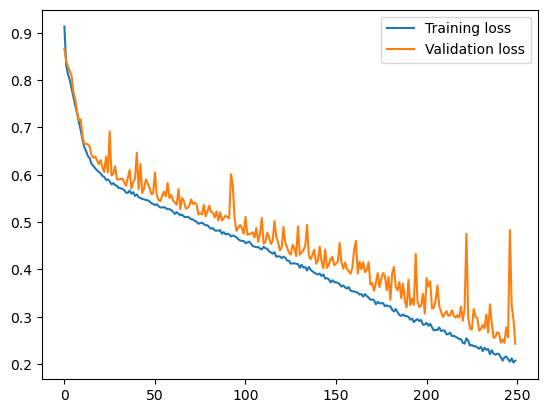

In [22]:
plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
plt.legend()

In [23]:
y_pred_classes

array([1, 1, 1, ..., 2, 0, 1], dtype=int64)

In [24]:
# Calculate test accuracy
test_accuracy = accuracy_score(np.argmax(Y_test, axis=1), y_pred_classes)
print("Test Accuracy:", test_accuracy)

Test Accuracy: 0.9139002576928907


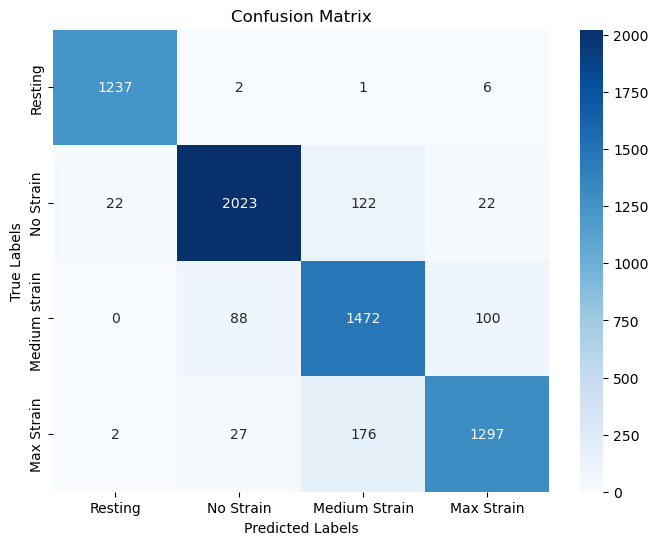

In [25]:
# Generate confusion matrix
conf_matrix = confusion_matrix(np.argmax(Y_test, axis=1), y_pred_classes)

# Plot confusion matrix as heatmap using Seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['Resting', 'No Strain','Medium Strain','Max Strain'], yticklabels=['Resting', 'No Strain','Medium strain ','Max Strain'])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

In [26]:
## Inference time calcualtion
start_time = time.time()

X_train_pred = model_lstm.predict(X_test)
# End the timer
end_time = time.time()

# Calculate the inference time
inference_time = end_time - start_time
print("Inference time:", inference_time)

207/207 [==============================] - 2s 10ms/step
Inference time: 2.2798972129821777


In [28]:
model_lstm.save('lstm.keras')

In [30]:
# Save the scaler to a file
with open('scaler.pkl', 'wb') as file:
    pickle.dump(scaler, file)

print("Scaler has been saved as 'scaler.pkl'")

Scaler has been saved as 'scaler.pkl'
